# Imports

This includes all necessary packeges for this simulation.

In [9]:
import pandas as pd # Dataframes
import matplotlib.pyplot as plt # Plot
import luxpy as lx # Spectrum calulation
import numpy as np
import scipy 
from scipy.integrate import simps 
import scipy.optimize as scp
import imageio 

## Import Data

All necessary data must be in the under folderpath defined folder
- ARRI Skypanel S60 C
- ARRI Orbiter 2 100ms
- CICPaperArriResponseScaledToD56WhiteBalance
- LEE/LEE Gels.csv

In [10]:
# CSVs from Photoresearch project
folderpath = "Files\\"

# PR670  ';' as delimiter and ',' instead of '.' for decimal numbers
def csv_to_df(filename, photoresearch = True):
    if photoresearch == True:
        df = pd.read_csv((folderpath + filename + '.csv'), delimiter=';', decimal=',')
        df = df[[df.columns[0]]+list(df.columns[:0:-1])]
    if photoresearch == False:
        df = pd.read_csv((folderpath + filename + '.csv'))
    return df

# get name of variable as string        
def namestr(obj, namespace):
    return [name for name in namespace if namespace[name] is obj]

# Plot part of Dataset, no specific entry: print all
def plot_part_of_data(df, start = 0, stop = 1000, sizex = 18, sizey= 12, grid = True):
    plt.figure(figsize=(sizex,sizey))
    # if start or stop are bigger than allowed values
    # set start and stop to min and max correct entry:
    if start < 1:
        start = 1
    if stop > len(df.columns):
        stop = len(df.columns)-1
    # check if enterd values are valid:
    if start <= ((len(df.columns))) and stop > 0 and start <= stop:
        # print every SPD in same chart
        for i in range (start, stop +1):
            plt.plot(df.iloc[:,0], df.iloc[:,i], label=df.columns[i])

        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.title(namestr(df, globals())[0])
        plt.xlabel('Namometers')
        plt.ylabel('Power')
        plt.grid(grid)
        
        plt.show()
    else:
        print('wrong start or stop input! maximum entries:', len(df.columns)-1)

def interpolate_camera(camera_curve):
  new_curve = lx.cie_interp(camera_curve.iloc[:,:].values.T.copy(), 
                            lx.getwlr([380,780,2]), kind = 'spd',extrap_values='ext')
  return new_curve


## SRGB to LINEAR and back Functions

In [11]:
def srgb2linear(x):
    linear = x.copy()
    less = linear <= 0.0404482362771082
    linear[less] = linear[less] / 12.92
    linear[~less] = np.power((linear[~less] + 0.055) / 1.055, 2.4)
    return linear

    
def linear2srgb(x):
    srgb = x.copy()
    less = x <= 0.0031308
    srgb[less] = x[less] * 12.92
    srgb[~less] = 1.055 * np.power(x[~less], 1.0 / 2.4) - 0.055
    return srgb

In [ ]:
def set_fontsizes(small = 7,medium = 8,big = 10):
    '''small: font, xtick, ytick,legend)
    medium: axes
    big: title fig, title ax
    '''
    SMALL_SIZE = small
    MEDIUM_SIZE = medium
    BIGGER_SIZE = big

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

## Import of data

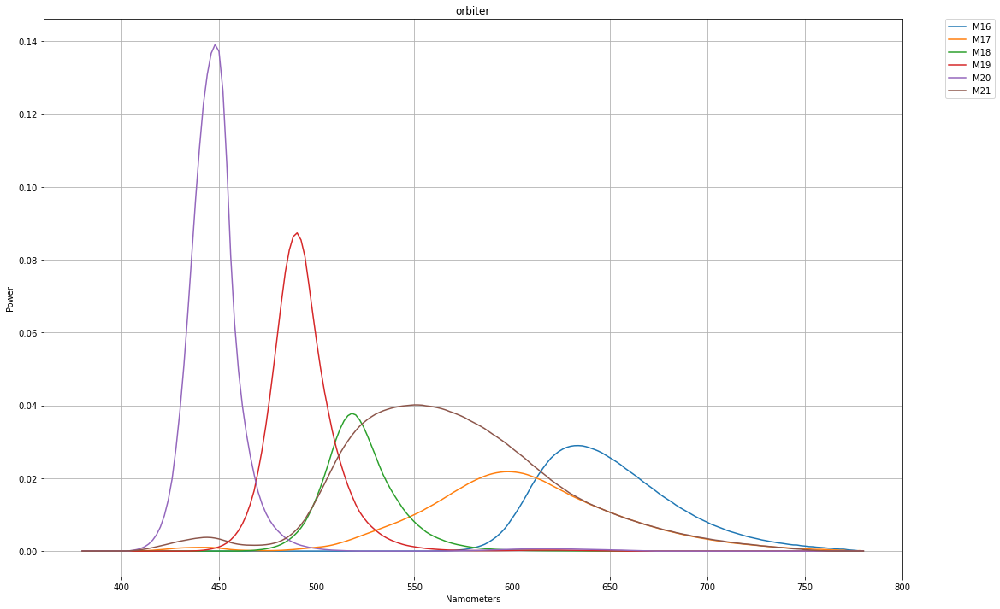

In [12]:
# Import Orbiter spectral data
orbiter = csv_to_df('orbiter 2 100ms')
plot_part_of_data(orbiter,16-5,21-5) # All single emitter

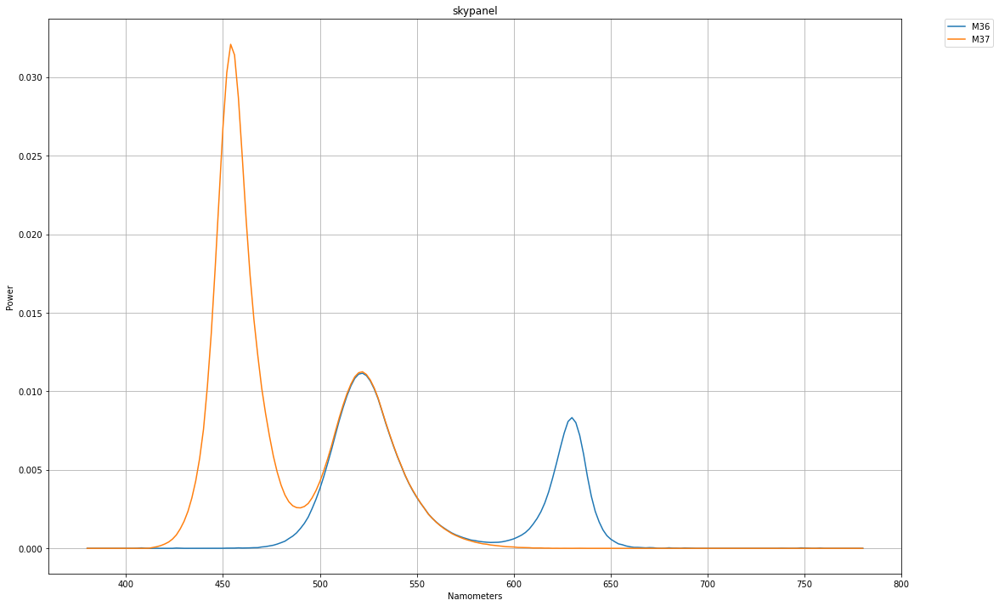

In [13]:
# Import Skypanel spectral data
skypanel = csv_to_df('Arri Skypanel S60 C')
plot_part_of_data(skypanel, 36,37)

## Import Gels and interpolate

In [14]:
# Import selection of LEE GELS
importLEE = pd.read_csv((folderpath + 'LEE Gels.csv'), delimiter=';', decimal=',')

# Interpolate gels to range of 380 nm to 780 nm with 2 nm step size
LEEGelsNP = lx.cie_interp(importLEE.values.T.copy(), lx.getwlr([380,780,2]), kind = 'spd')

LEEGels = pd.DataFrame(LEEGelsNP.T,columns=importLEE.columns)

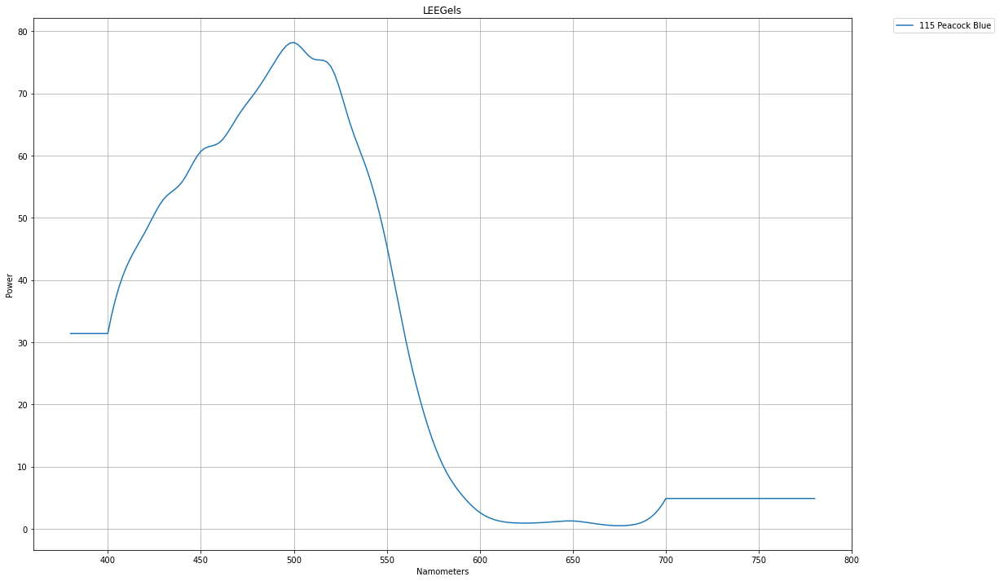

In [15]:
plot_part_of_data(LEEGels,5,5)

## Import ARRI Alexa Mini LF Camera Curves

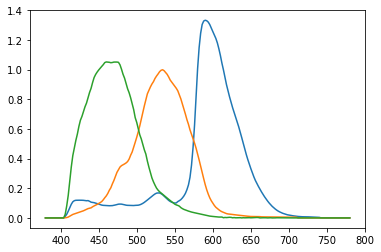

In [16]:
alexa_CIC_WB   = np.genfromtxt(folderpath + 'CICPaperArriResponseScaledToD56WhiteBalance' + '.csv', delimiter=',')

def interpolate_camera(camera_curve):
    if isinstance(camera_curve, pd.DataFrame):
        new_curve = lx.cie_interp(camera_curve.iloc[:,:].values.T.copy(), 
                            lx.getwlr([350,750,2]), kind = 'spd')
    elif isinstance(camera_curve, np.ndarray):
        new_curve = lx.cie_interp(camera_curve.copy(), 
                            lx.getwlr([380,780,2]), kind = 'spd')        
    else:
        print('wrong input type, just dataframe or ndarray allowed')
    return new_curve

alexa_CIC_WB   = interpolate_camera(alexa_CIC_WB)

plt.plot(alexa_CIC_WB[0],alexa_CIC_WB[1])
plt.plot(alexa_CIC_WB[0],alexa_CIC_WB[2])
plt.plot(alexa_CIC_WB[0],alexa_CIC_WB[3])

Whitebalance through scaling of R,G,B: areas under curve

In [17]:
red_area = simps(alexa_CIC_WB[1,:], dx=2)
green_area = simps(alexa_CIC_WB[2,:], dx=2)
blue_area = simps(alexa_CIC_WB[3,:], dx=2)

values = 1/([red_area,green_area,blue_area]/green_area)
print(values)

[9.1741e-01 1.0000e+00 9.5061e-01]


## Import Hyperspectral Images

All Hyperspectral Images Available at: https://www.cs.columbia.edu/CAVE/databases/multispectral/

In [18]:
# Read PNG into 3D array(16bit gray-value image [values from 0 to 65536]; 400nm to 700nm at 10nm steps [31 bands total]):

pepImgages = np.stack( [ np.float64(imageio.imread(folderpath + 'peppers_ms\\fake_and_real_peppers_ms\\fake_and_real_peppers_ms_' + '{:02d}'.format(i) + '.png')) [...,np.newaxis] for i in range(1,32) ], axis=3) / (2 ** 16)

pepImgages.shape

(512, 512, 1, 31)

In [19]:
hyper_folder = folderpath + 'peppers_ms\\fake_and_real_peppers_ms'

def import_hyper_img (filename, folderpath = hyper_folder):
    return np.stack( [ np.float64(imageio.imread(folderpath + filename +'/' + filename + '_{:02d}'.format(i) + '.png')) [...,np.newaxis] for i in range(1,32) ], axis=3) / (2 ** 16)

# Define SPD for every single color filter of the hyperspectral camera

Gauß-curves with a peak every 10nm (reference: https://www.cs.columbia.edu/CAVE/databases/multispectral/)
Std.dev

31 Gauß-curves for the spectral sensitivity of every single filtered sensor. (hyperSpecSensClean)  

curves = peak, Standard deviation: best result at 7. Normalised to 1 and maxSpec defined (maximum possible value after addition)


In [20]:
curves = np.arange(400,710,10) 
hyperSpecSensClean = np.zeros((32,201)) # new Array 1. Dimension = wfl, 1.-31.colorfilter; 2. values
hyperSpecSensClean[0] = np.arange(350,752,2) # first row: wavelength

for i in range (31):   
    hyperSpecSensClean[i+1] = scipy.stats.norm(curves[i],7).pdf(hyperSpecSensClean[0])

hyperSpecSensClean[1:,:] = hyperSpecSensClean[1:,:] / np.max(hyperSpecSensClean[1:,:])

maxSpec = np.max(np.sum(hyperSpecSensClean[1:].T, axis=1))
print(maxSpec)

1.7548609130099042


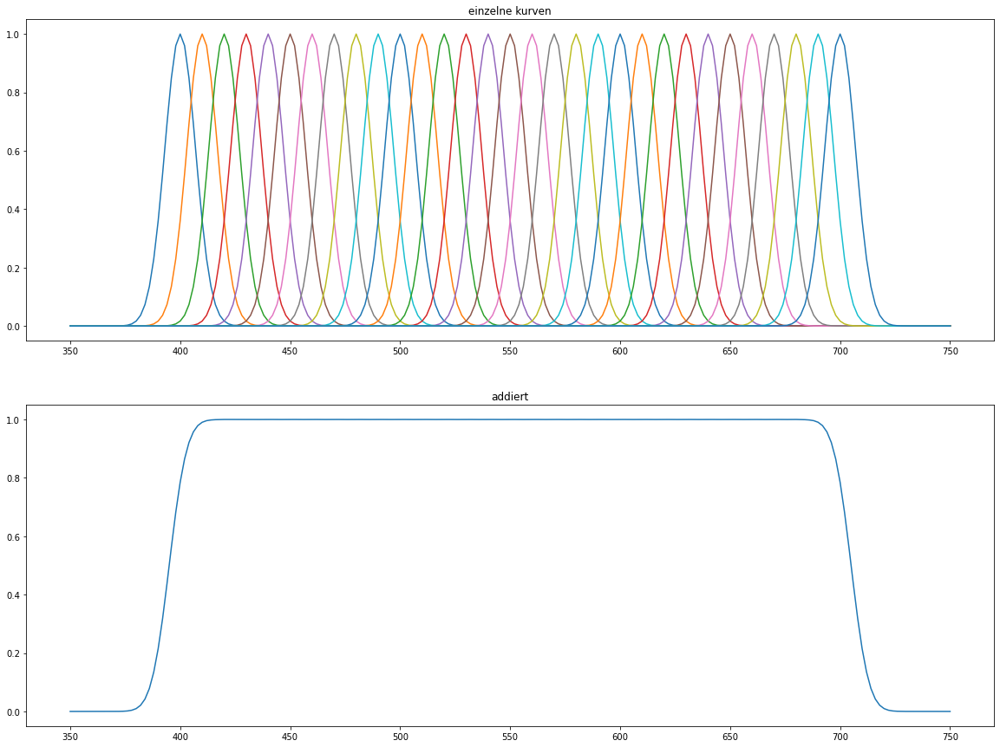

In [21]:
plt.figure(figsize=(20,15))
plt.subplot(2,1,1)
plt.title('single curve')
plt.plot(hyperSpecSensClean[0],hyperSpecSensClean[1:].T)
plt.subplot(2,1,2)
plt.title('added')
plt.plot(hyperSpecSensClean[0],np.sum(hyperSpecSensClean[1:].T, axis=1)/maxSpec);

# Calculating Hyperspectral Image to SPD per Pixel

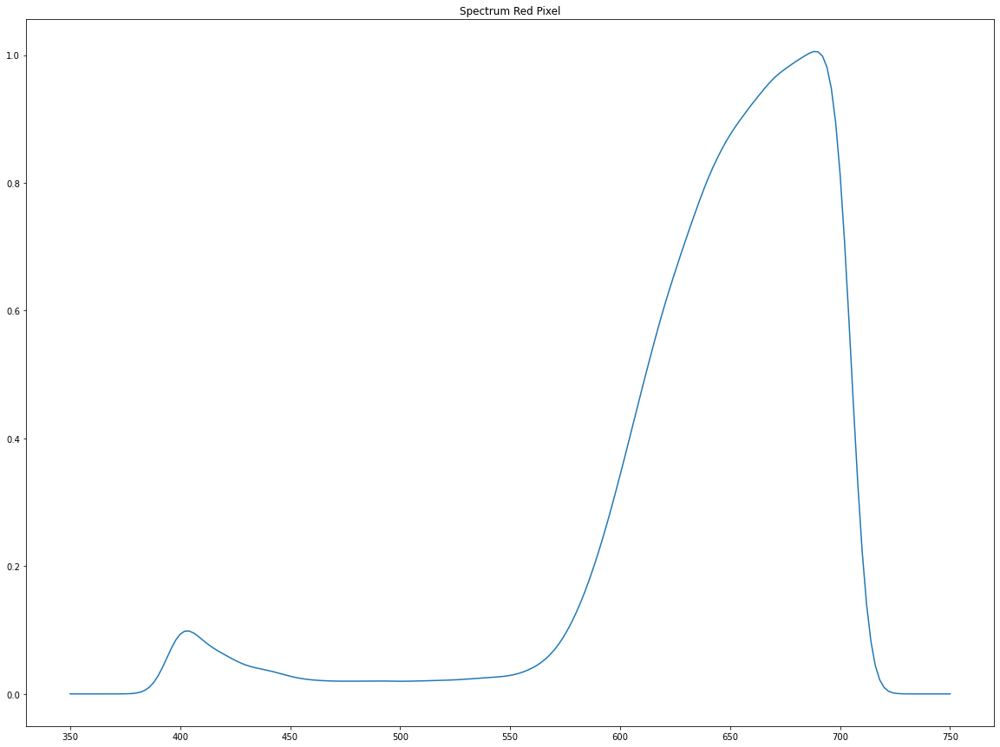

In [36]:
# Test with one pixel from the red pepper
# Spectrum_Image[yPixel,xPixel,wfl,values]
Spectrum_Image = np.zeros((512,512,201))

for i in range (31):
    Spectrum_Image[250,133,:] += pepImgages[250,133,0,i] * hyperSpecSensClean[i+1]

plt.figure(figsize=(20,15))
plt.title('Spectrum Red Pixel')
plt.plot(np.arange(350,752,2),Spectrum_Image[250,133,:]);

## Three main functions
- hyperImgtoSpcImg: 31 brightness values per Pixel from the hyperspectral image combined with the hyperSpecSensClean Gauß-curves. returns: 201 values from 380 nm to 780 nm with a 2 nm step size
- SpcImgWithLight: The spectral imageis combined with a light source or with a light source + gel
- SpcImgtoRGBImg: The spectral sensitivity of the camera (ARRI Alexa) is used to calculate RGB-values from the SPD of each pixel

In [23]:
def hyperImgtoSpcImg (hyperImg, hyperSpecSens = hyperSpecSensClean): 
    return np.dot( hyperImg[:,:,0,:], hyperSpecSens[1:] )

D65 = lx.cie_interp(lx._CIE_ILLUMINANTS['D65'],lx.getwlr([380,780,2]), kind = 'spd',extrap_values='ext')

def SpcImgWithLight (SpecImg, light, light_number, Gel=False):
    SpecImg = np.multiply(SpecImg.copy(), 1 / D65[1])
    if Gel:
        # Light * Gel
        gel_curve = np.multiply(light.iloc[:,light_number].values.T ,
                            LEEGels.iloc[:,Gel].values.T)
        # SpecImg * gel_curve
        SpecImg = np.multiply(SpecImg.copy(), gel_curve)

        return SpecImg
    else:
        SpecImg = np.multiply(SpecImg.copy(), light.iloc[:,light_number].values.T.copy())
        
        return SpecImg

def SpcImgtoRGBImg (SpecImg, CamCurve = alexa_CIC_WB, wbCorr = values):
    rgbImg = np.zeros((512,512,3))
    #SpecImg_3 = np.repeat(SpecImg,3, axis = 2)
    rgbImg[:,:,0] = np.dot( SpecImg, CamCurve[1] )* values[0]
    rgbImg[:,:,1] = np.dot( SpecImg, CamCurve[2] )* values[1]
    rgbImg[:,:,2] = np.dot( SpecImg, CamCurve[3] )* values[2]
    return rgbImg

In [37]:
# The Plot shows the two lighting simulations with the SPD and the simulated image

def plot_sheet (hyperImg, sim_light, sim_light_number, gel_light, gel_light_number, Gel, CamCurve = alexa_CIC_WB, hyperSpecSens = hyperSpecSensClean,):
    
    gel_curve = np.multiply(gel_light.iloc[:,gel_light_number].values.T ,
                            LEEGels.iloc[:,Gel].values.T)

    img_light = SpcImgtoRGBImg( SpcImgWithLight (hyperImgtoSpcImg( hyperImg),
                               sim_light,sim_light_number))
    img_gel = SpcImgtoRGBImg( SpcImgWithLight (hyperImgtoSpcImg( hyperImg),
                               gel_light,gel_light_number,Gel))


    plt.figure(figsize=(20,20))
    plt.subplot(2,2,1)
    plt.title('SPD ' +' simulated Gel')
    plt.plot(sim_light.iloc[:,0], sim_light.iloc[:,sim_light_number], 
             label=sim_light.columns[sim_light_number])
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xlabel('Namometers')
    plt.ylabel('Power')
    plt.grid(True)
        
    plt.subplot(2,2,2)
    plt.title('SPD '+ str(namestr(gel_light, globals())[0]) +' with Lee Gels '+
              str(LEEGels.columns[Gel]))
    plt.plot(LEEGels.iloc[:,0], gel_curve, 
             label=gel_light.columns[gel_light_number])

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xlabel('Namometers')
    plt.ylabel('Power')
    plt.grid(True)

    plt.subplot(2,2,3)
    plt.title('image with simulated LED Gel')
    plt.imshow(linear2srgb(img_light/np.max(img_light)))
    plt.subplot(2,2,4)
    plt.title('image with gel in front of lightsource')
    plt.imshow(linear2srgb(img_gel/np.max(img_gel)))
    plt.show()

In [25]:
# Optimizing the simulated gel

def SPD_from_combination(light, number, Gel, Gel_number):
    SPD = np.stack((light.iloc[:,0].values.T,np.multiply(light.iloc[:,number].values.T ,
                            Gel.iloc[:,Gel_number].values.T)), axis = 0)
    return SPD

def getUV(SPD):
    Yuv = lx.colortf(SPD, tf = 'spd>Yuv')
    u = Yuv[:,1]
    v = Yuv[:,2]
    return u,v

def minUV(SPD,Sim):
    uDiff = (getUV(Sim)[0] - getUV(SPD)[0])
    vDiff = (getUV(Sim)[1] - getUV(SPD)[1])
    return (uDiff,vDiff)

def getGelSim(sim_light,factors):
    if sim_light.equals(skypanel):
        emitter_numbers = [14 ,15 ,16 ,17 ]
        #                  r  ,g  ,b  ,w    
        fixture = 'Skypanel'
    elif sim_light.equals(orbiter):
        emitter_numbers = [11 ,12 ,13 ,14 ,15 ,16 ]
        #                  r  ,a  ,g  ,c  ,b  , l 
        fixture = 'Orbiter'
    
    # Einzelemitter kombinieren
    added_curve = np.zeros(201)
    f = 0
    for i in emitter_numbers:
        added_curve += sim_light.iloc[:,i].values * factors[f]
        f += 1
    # Wellenlängen Zeile hinzufügen
    Sim = np.stack((sim_light.iloc[:,0],added_curve), axis = 0)
    return Sim

def get_best_spd(sim_light, gel_light, gel_light_number, Gel, Gel_number, output = 'SPD',x0 = False):
    SPD = SPD_from_combination(gel_light, gel_light_number, Gel, Gel_number)
    def function (x,SPD = SPD, simlight = sim_light):
        UVDiffs = minUV(SPD,getGelSim(simlight,x))
        UVw = np.sqrt( UVDiffs[0]**2 + UVDiffs[1]**2 )
        return UVw
    
    # x0 und borders abhänig von Anzahl der Emitter bestimmen
    b = (0.0,1.0)

    if sim_light.equals(skypanel):
        if x0 == False:
            x0 = (0.1,0.1,0.1,0.1)
        #     r  ,g  ,b  ,w
        borders = (b,b,b,b)   
        fixture = 'Skypanel'
    elif sim_light.equals(orbiter):
        if x0 == False:
            x0 = (0.1,0.1,0.1,0.1,0.1,0.1)
        #     r  ,a  ,g  ,c  ,b  ,l 
        borders = (b,b,b,b,b,b)   
        fixture = 'Orbiter'
           
    else:
        print('wrong sim_light name,  x0 not defined')
    
    # optimize
    bestFactors = scp.minimize(function,x0, bounds = borders)
    
    # Meldungen ausgeben
    sim_name = fixture
    if gel_light.equals(skypanel):
        gel_name = 'Skypanel'
    elif gel_light.equals(orbiter):
        gel_name = 'Orbiter'
    print('Adaptation to : ' + gel_name + str( gel_light.columns[gel_light_number] ) + ' mit ' +str(Gel.columns[Gel_number]))
    print('Optimized mix of ' + sim_name + ' with error of ' + str(bestFactors.fun))
    if bestFactors.success == False:
        print('! Optimierung Fehlgeschlagen. Debug mit: get_best_factors(...,...,...,..., output = \'full\')')
    
    # Ausgabe Faktoren bzw. optimize Objekt
    if output == 'just factors':
        return bestFactors.x
    if output == 'full':
        return bestFactors
    if output == 'SPD':
        return pd.DataFrame( getGelSim(sim_light, bestFactors.x).T )


Angleichung an : SkypanelM5 mit 101 Yellow
Optimierte Mischung des Skypanel mit Restfehler [5.0533e-03]


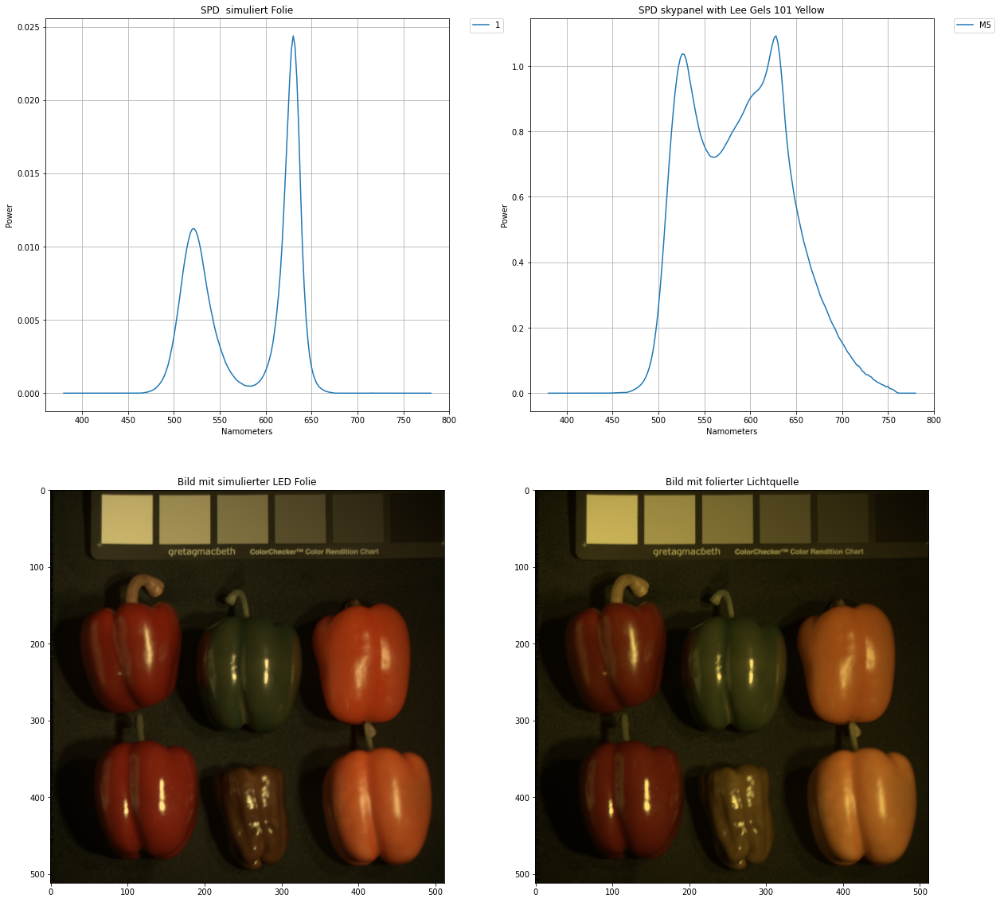

In [26]:
plot_sheet(pepImgages, get_best_spd(skypanel, skypanel, 5, LEEGels, 8 ), 1, skypanel, 5, 8)

Angleichung an : OrbiterM9 mit 101 Yellow
Optimierte Mischung des Orbiter mit Restfehler [2.2332e-03]


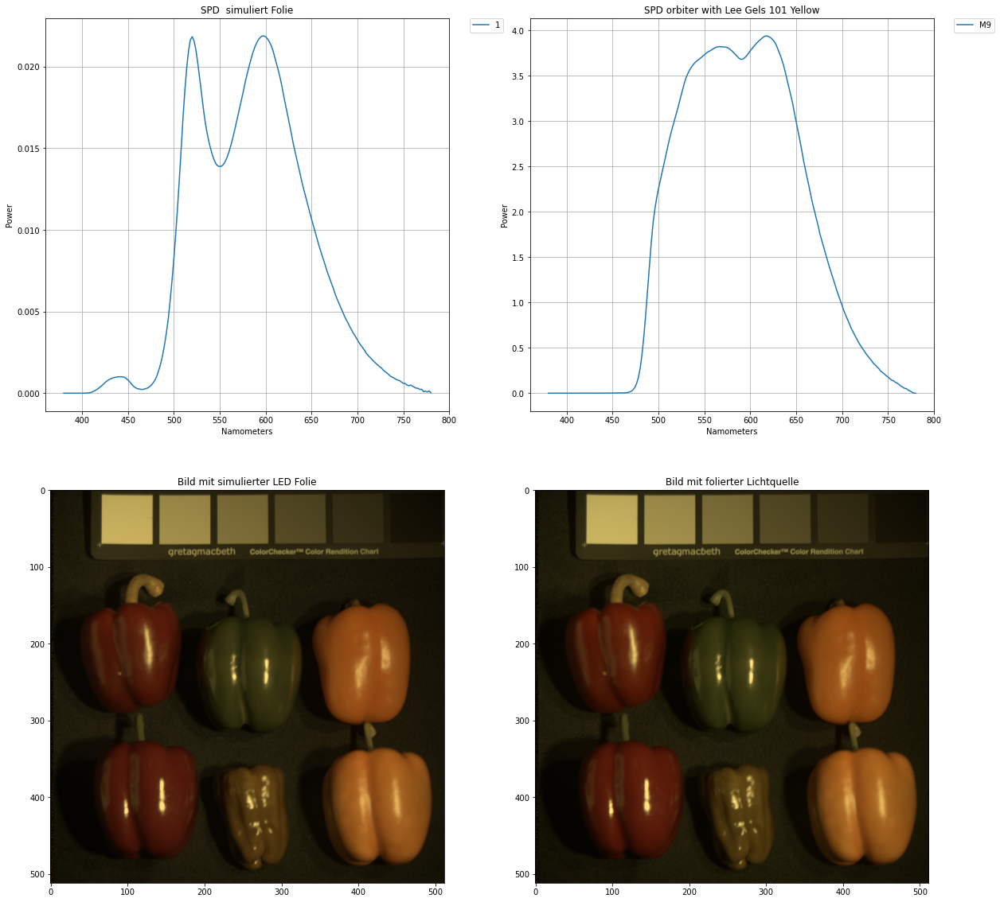

In [27]:
plot_sheet(pepImgages, get_best_spd(orbiter, orbiter, 4, LEEGels, 8 ), 1, orbiter, 4, 8)

Angleichung an : SkypanelM5 mit 156 Chocolate
Optimierte Mischung des Skypanel mit Restfehler [3.0082e-09]


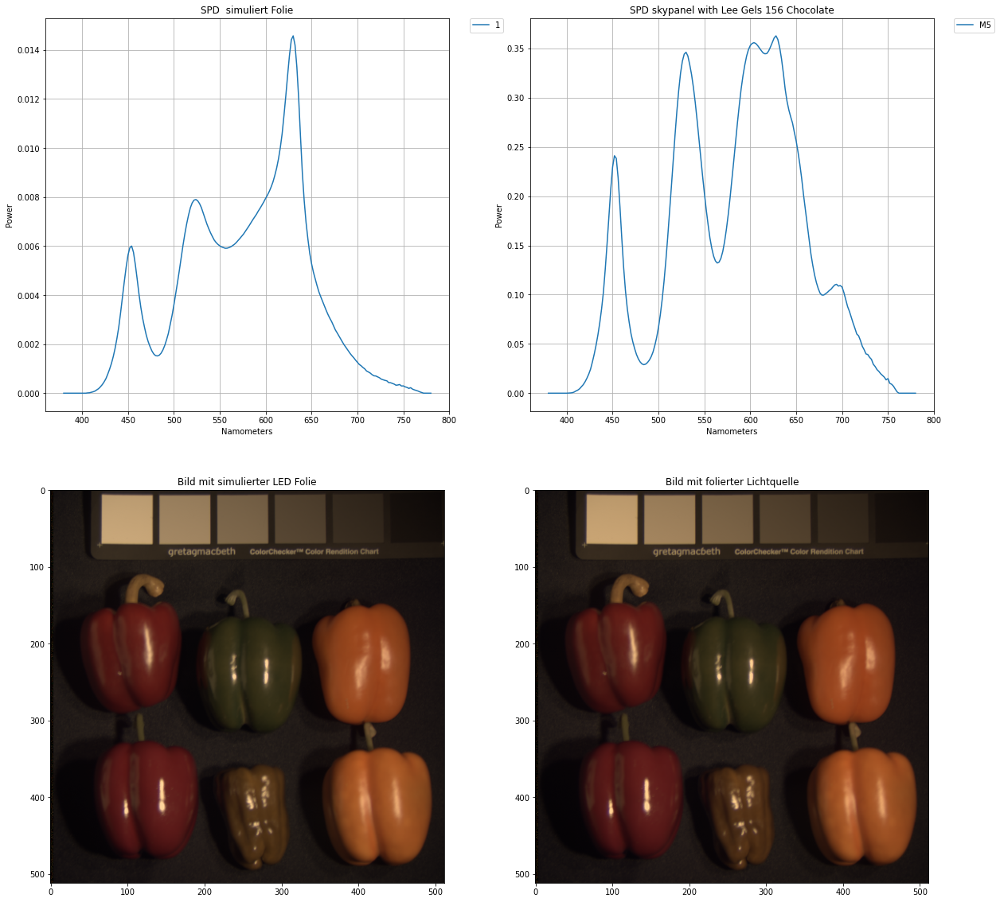

In [28]:
plot_sheet(pepImgages, get_best_spd(skypanel, skypanel, 5, LEEGels, 18 ), 1, skypanel, 5, 18)

In [29]:
jellys = import_hyper_img('jelly_beans_ms', folderpath=folderpath )

Angleichung an : SkypanelM5 mit 101 Yellow
Optimierte Mischung des Skypanel mit Restfehler [5.0533e-03]


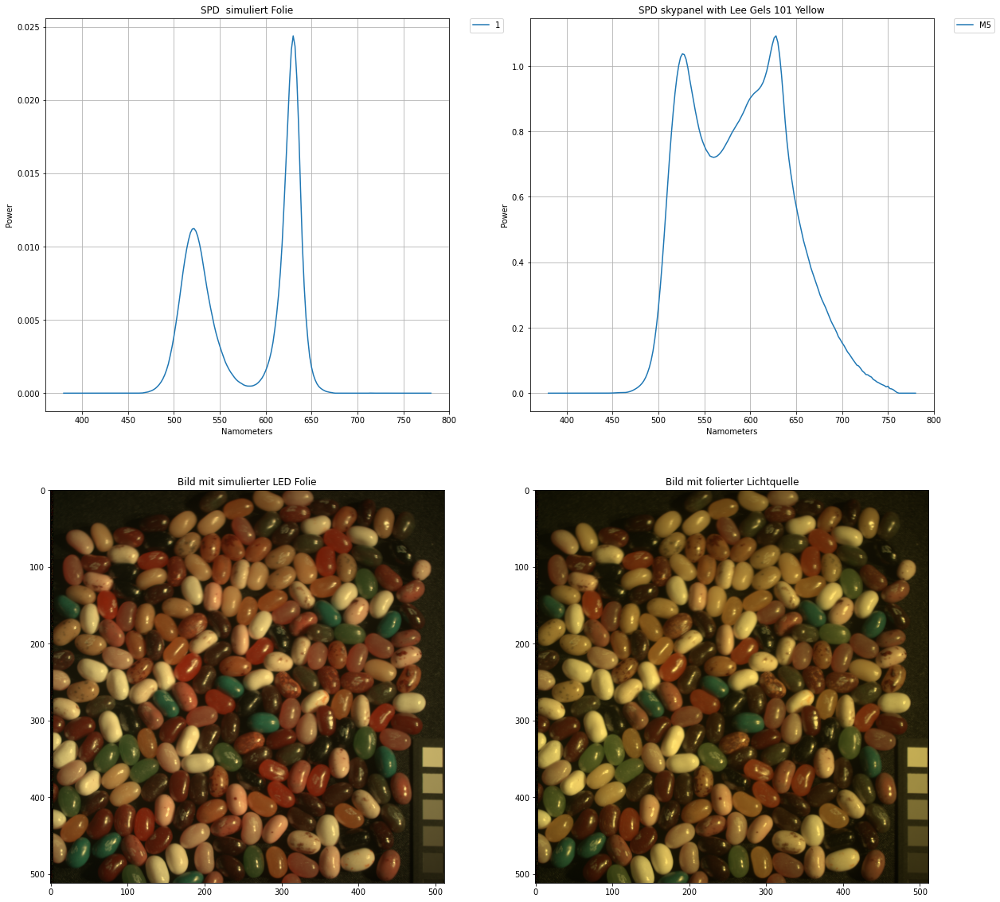

In [30]:
plot_sheet(jellys, get_best_spd(skypanel, skypanel, 5, LEEGels, 8 ), 1, skypanel, 5, 8)

Angleichung an : OrbiterM9 mit 101 Yellow
Optimierte Mischung des Orbiter mit Restfehler [2.2332e-03]


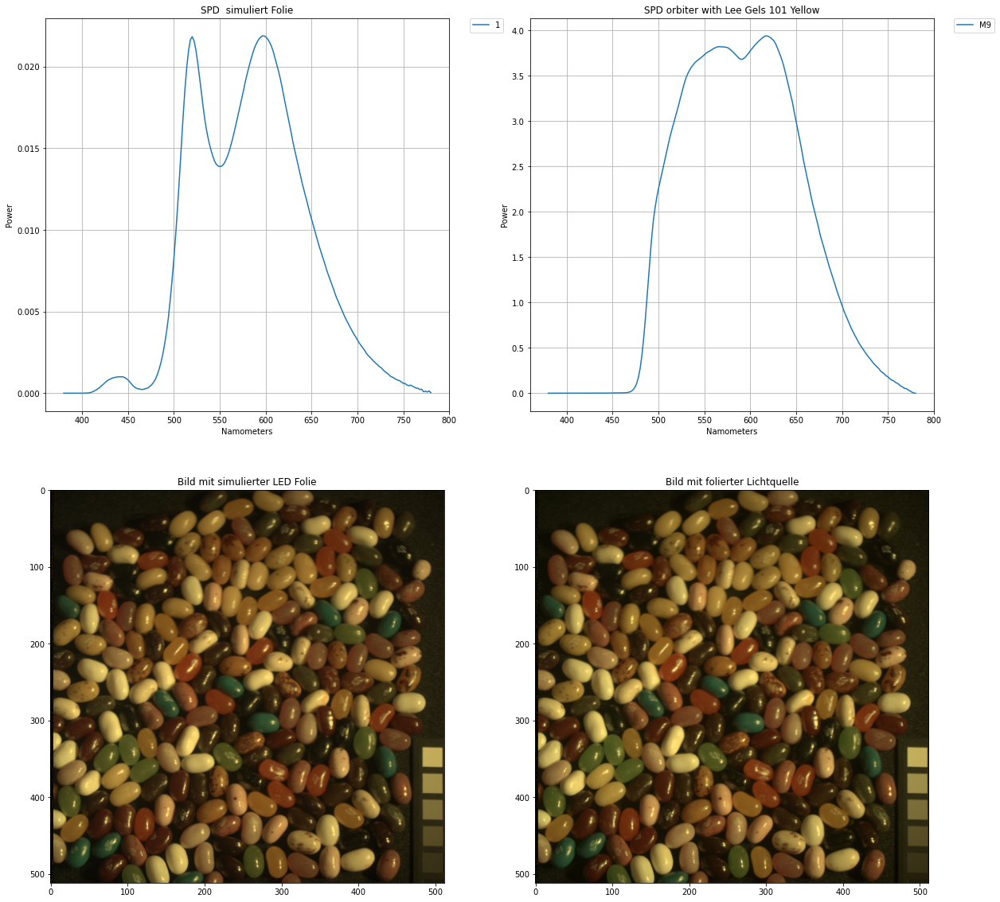

In [31]:
plot_sheet(jellys, get_best_spd(orbiter, orbiter, 4, LEEGels, 8 ), 1, orbiter, 4, 8)

# The Real Pepper Experiment

In [32]:
#Import Data from Experiment
skysim = pd.read_csv((folderpath + 'Skypanel Sim Gels' + '.csv'), delimiter=';', decimal=',')
skyreal = pd.read_csv((folderpath + 'Skypanel Real Gels' + '.csv'), delimiter=';', decimal=',')
orbitersim = pd.read_csv((folderpath + 'Orbiter Sim Gels' + '.csv'), delimiter=';', decimal=',')
orbiterreal = pd.read_csv((folderpath + 'Orbiter Real Gels' + '.csv'), delimiter=';', decimal=',')

In [33]:
def plot_real_sheet (hyperImg, sim_light, sim_light_number, gel_light, gel_light_number, CamCurve=alexa_CIC_WB, hyperSpecSens = hyperSpecSensClean ):
    
    # Gel Curve wird hier nur für SPD Plot ausgeführt.
    # Die Verarbeitung der Kurve geschieht in SpcImgWithLight
    gel_curve = gel_light.iloc[:,gel_light_number].values.T
    
    # Bilder zur Ausgabe berechenen
    img_light = SpcImgtoRGBImg( SpcImgWithLight (hyperImgtoSpcImg( hyperImg),
                               sim_light,sim_light_number),CamCurve)
    img_gel = SpcImgtoRGBImg( SpcImgWithLight (hyperImgtoSpcImg( hyperImg),
                               gel_light,gel_light_number), CamCurve)

    # Berechnung & Normalisierung beider SPDs auf 100 Lumen
    sim_light_curve_100lm = lx.spd_normalize(np.stack((sim_light.iloc[:,0],sim_light.iloc[:,sim_light_number].copy()),axis = 0), 
                            norm_type = 'pu',norm_f = 100) # 100 Lumen
    
    gel_curve_100lm =       lx.spd_normalize(np.stack((sim_light.iloc[:,0].values.T,gel_curve.copy()),axis = 0), 
                            norm_type = 'pu',norm_f = 100) # 100 Lumen
    
    # Plot
    f = plt.figure(figsize=(10,15))   
    plt.subplot(3,2,1)
    # Ausgabe SPD PLot
    plt.title('Vergleich SPDs')
    plt.plot(sim_light_curve_100lm[0],sim_light_curve_100lm[1], label =  'Gel Mode ' + str( sim_light.columns[sim_light_number] ) )
    plt.plot(gel_curve_100lm[0],gel_curve_100lm[1],             label= 'Real Gel '+ str( gel_light.columns[gel_light_number] ) )
    # Legende ausgeben
    plt.legend(bbox_to_anchor=(0, 1), loc='upper left', borderaxespad=0.)
    # Titel und Achsenbeschriftungen
    plt.xlabel('Namometers')
    plt.ylabel('Power')
    plt.grid(True)
    
    # Errechnete Bilder ausgeben
    plt.subplot(3,2,3)
    plt.title(str(namestr(CamCurve, globals())[0]) +' Gel Mode')
    plt.imshow(linear2srgb(img_light/np.max(img_light)))
    plt.subplot(3,2,4)
    plt.title(str(namestr(CamCurve, globals())[0]) +' Real Gel')
    plt.imshow(linear2srgb(img_gel/np.max(img_gel)))
    
    plt.show()

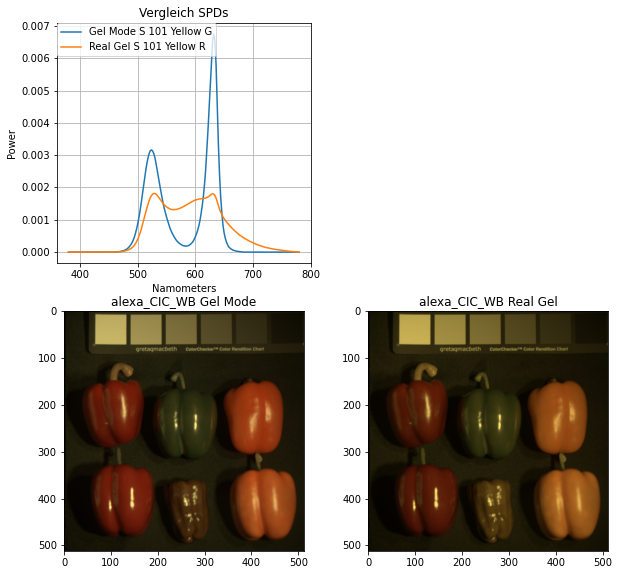

In [34]:
plot_real_sheet(pepImgages, skysim, 4, skyreal, 9)

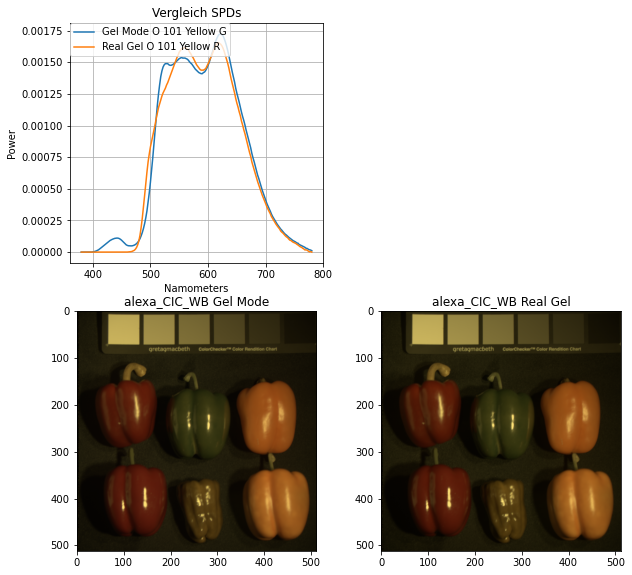

In [35]:
plot_real_sheet(pepImgages, orbitersim, 4, orbiterreal, 9)